# DS 8. $x \to \hat{y}$ 가 되는 과정 그리기, Layer의 개념, Keras를 이용한 풀이, 여러가지 회귀모형의 적합과 학습과정의 모니터링

> "작성완료"

- toc: true
- branch: master
- badges: true
- comments: true
- [python, Data Science]

---
# Data Science
- lenture: Data Science_6nd week of lectures.
- lenture date: 2022-04-11
- lecturer: Guebin choi
- study date: 2022-04-12, 2022-04-13
- author: Kione kim
---

In [1]:
import numpy as np
import matplotlib.pyplot as plt 
import tensorflow as tf 
import tensorflow.experimental.numpy as tnp 

In [2]:
tnp.experimental_enable_numpy_behavior()

In [3]:
import graphviz
def gv(s): return graphviz.Source('digraph G{ rankdir="LR"'+s + '; }')

### $x \to \hat{y}$ 가 되는 과정을 그림으로 그리기

`-` 단순회귀분석의 예시
- $\hat{y}_i = \hat{\beta}_0 + \hat{\beta}_1 x_i, \quad i=1,2,\dots,n$

(표현1)

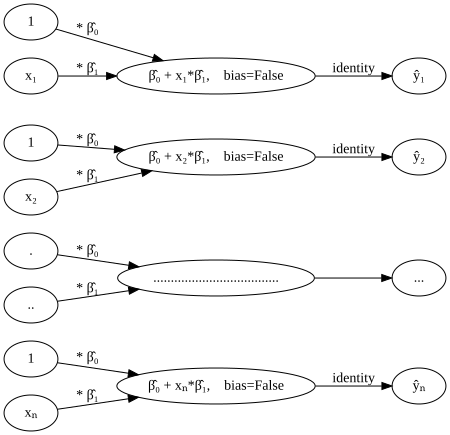

In [4]:
#collapse
gv(''' 
    "1" -> "β̂₀ + xₙ*β̂₁,    bias=False"[label="* β̂₀"]
    "xₙ" -> "β̂₀ + xₙ*β̂₁,    bias=False"[label="* β̂₁"]
    "β̂₀ + xₙ*β̂₁,    bias=False" -> "ŷₙ"[label="identity"]

    "." -> "...................................."[label="* β̂₀"]
    ".." -> "...................................."[label="* β̂₁"]
    "...................................." -> "..."[label=" "]

    "1 " -> "β̂₀ + x₂*β̂₁,    bias=False"[label="* β̂₀"]
    "x₂" -> "β̂₀ + x₂*β̂₁,    bias=False"[label="* β̂₁"]
    "β̂₀ + x₂*β̂₁,    bias=False" -> "ŷ₂"[label="identity"]
    
    "1  " -> "β̂₀ + x₁*β̂₁,    bias=False"[label="* β̂₀"]
    "x₁" -> "β̂₀ + x₁*β̂₁,    bias=False"[label="* β̂₁"]
    "β̂₀ + x₁*β̂₁,    bias=False" -> "ŷ₁"[label="identity"]
''')


`-` 표현1 소감:  
- 다 똑같은 그림의 반복이 아닌가? 

(표현2)

`-` 그냥 아래와 같이 그리고 "모든 $i=1,2,3,\dots,n$에 대하여 $\hat{y}_i$을 아래의 그림과 같이 그린다"고 하면 될것 같다. 

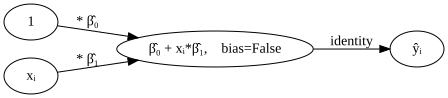

In [5]:
#collapse
gv(''' 
    "1" -> "β̂₀ + xᵢ*β̂₁,    bias=False"[label="* β̂₀"]
    "xᵢ" -> "β̂₀ + xᵢ*β̂₁,    bias=False"[label="* β̂₁"]
    "β̂₀ + xᵢ*β̂₁,    bias=False" -> "ŷᵢ"[label="identity"]

''')


(표현3) 

`-` 그런데 "모든 $i=1,2,3,\dots,n$에 대하여 $\hat{y}_i$을 아래의 그림과 같이 그린다" 라는 언급자체도 반복할 필요가 없을 것 같다. 단순히 아래와 같이 그려도 무방할듯 하다. 

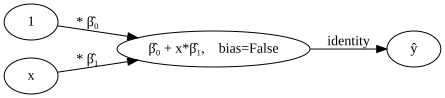

In [6]:
gv(''' 
    "1" -> "β̂₀ + x*β̂₁,    bias=False"[label="* β̂₀"]
    "x" -> "β̂₀ + x*β̂₁,    bias=False"[label="* β̂₁"]
    "β̂₀ + x*β̂₁,    bias=False" -> "ŷ"[label="identity"]

''')


(표현4)

`-` 위의 모델은 아래와 같이 쓸 수 있다. ($\beta_0$를 바이어스로 표현) 

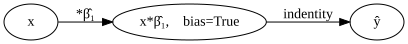

In [7]:
#collapse
gv('''
"x" -> "x*β̂₁,    bias=True"[label="*β̂₁"] ;
"x*β̂₁,    bias=True" -> "ŷ"[label="indentity"] ''')


- 실제로는 이 표현을 많이 사용함 

(표현5)

`-` 벡터버전으로 표현하면 아래와 같다. 이 경우에는 ${\bf X}=[1,x]$에 포함된 1이 bias의 역할을 해주므로 `bias = False` 임. 

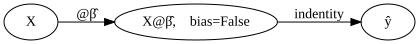

In [8]:
#collapse
gv('''
"X" -> "X@β̂,    bias=False"[label="@β̂"] ;
"X@β̂,    bias=False" -> "ŷ"[label="indentity"] ''')


(표현5)'

`-` 딥러닝에서는 $\hat{\boldsymbol{\beta}}$ 대신에 $\hat{{\bf W}}$을 라고 표현한다. 

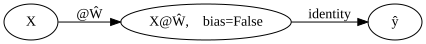

In [9]:
#collapse
gv('''
"X" -> "X@Ŵ,    bias=False"[label="@Ŵ"] ;
"X@Ŵ,    bias=False" -> "ŷ"[label="identity"] ''')


`-` 실제로는 표현4~6를 잘 사용한다. 

### Layer의 개념 

`-` (표현4~6)의 그림은 레이어로 설명할 수 있다. 

`-` 레이어는 항상 아래와 같은 규칙을 가진다. 
- 첫 동그라미는 레이어의 입력이다. 
- 첫번째 화살표는 선형변환을 의미한다. 
- 두번째 동그라미는 선형변환의 결과이다. (이때 bias가 false인지 true인지에 따라서 실제 수식이 조금 다름) 
- 두번째 화살표는 두번째 동그라미에 어떠한 함수 $f$를 취하는 과정을 의미한다. (우리의 그림에서는 $f(x)=x$) 
- 세번째 동그라미는 레이어의 최종출력이다. 

`-` 꽤 복잡한데, 결국 레이어를 만들때 위의 그림들을 의미하도록 하려면 아래의 4개의 요소만 필요하다.

`1.` 레이어의 입력차원 

`2.` 선형변환의 결과로 얻어지는 차원

`3.` 선형변환에서 바이어스의 사용유무 

`4.` 함수 $f$

`-` **중요1**: `1`,`2`가 결정되면 자동으로 $\hat{{\bf W}}$의 차원이 결정된다. 

(예시)
- 레이어의 입력차원=2, 선형변환의 결과로 얻어지는 차원=1: $\hat{\bf W}$는 (2,1) 매트릭스 
- 레이어의 입력차원=20, 선형변환의 결과로 얻어지는 차원=5: $\hat{\bf W}$는 (20,5) 매트릭스 
- 레이어의 입력차원=2, 선형변환의 결과로 얻어지는 차원=50: $\hat{\bf W}$는 (2,50) 매트릭스 

`-` **중요2**: 이중에서 절대 생략불가능 것은 "2. 선형변환의 결과로 얻어지는 차원" 이다. 
- 레이어의 입력차원: 실제 레이어에 데이터가 들어올 때 데이터의 입력차원을 컴퓨터 스스로 체크하여 $\hat{\bf W}$의 차원을 결정할 수 있음. 
- 바이어스의 사용유무는 기본적으로 사용한다고 가정한다. 
- 함수 $f$: 기본적으로 항등함수를 가정하면 된다. 

### 케라스를 이용한 풀이

``` python
기본뼈대: 
    1.net생성 
    2.add(layer) 
    3.compile(opt,loss) 
    4.fit(data,epochs)
2. layer를 생성: x에서 y_hat을 만드는 방법을 정의하는 것을 의미
3. compile(opt,loss)의 의미: 손실함수를 정의하고 손실함수를 최소화시키는 반복 알고리즘을 결정할 옵티마이저를 정하는 것을 의미
4. fit(): 반복 학습
```

`-` 데이터

$${\bf y}\approx 2.5 +4*x$$ 

In [10]:
tnp.random.seed(50000)
N=200
x=tnp.linspace(0,1,N)
epsilon=tnp.random.randn(N)*0.5
y=2.5+4*x+epsilon

In [11]:
X=tf.stack([tf.ones(N,dtype='float64'),x],axis=1)

#### 풀이1: 스칼라

`-` 데이터 정리

In [12]:
y=y.reshape(-1)
x.shape,y.shape

(TensorShape([200]), TensorShape([200]))

`1.` net 생성

In [13]:
net=tf.keras.Sequential()

`2.` net.add(layer)

In [14]:
layer=tf.keras.layers.Dense(1)

- Dense(n): 선형변환의 결과로 얻어지는 n차원, 여기서는 1차원이기에 Dense(1)
- 숨겨진 의미: 레이어의 입력차원= 데이터를 넣어보고 결정, 바이어스= 디폴트 값을 따름(디폴트:use_bias=true), 함수= 디폴트 값을 따름(디폴트:f(x)=x)

In [15]:
net.add(layer)

`3.` net.compile(opt,loss_fn)

In [16]:
net.compile(tf.keras.optimizers.SGD(0.1),tf.keras.losses.MSE)

- optimizer와 loss_fn을 바로 선언해주었음

`4.` net.fit(x,y,epochs)

In [17]:
net.fit(x,y,epochs=1000,verbose=0,batch_size=N)

ValueError: in user code:

    File "C:\Users\kko\anaconda3\envs\ds2022\lib\site-packages\keras\engine\training.py", line 1021, in train_function  *
        return step_function(self, iterator)
    File "C:\Users\kko\anaconda3\envs\ds2022\lib\site-packages\keras\engine\training.py", line 1010, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "C:\Users\kko\anaconda3\envs\ds2022\lib\site-packages\keras\engine\training.py", line 1000, in run_step  **
        outputs = model.train_step(data)
    File "C:\Users\kko\anaconda3\envs\ds2022\lib\site-packages\keras\engine\training.py", line 859, in train_step
        y_pred = self(x, training=True)
    File "C:\Users\kko\anaconda3\envs\ds2022\lib\site-packages\keras\utils\traceback_utils.py", line 67, in error_handler
        raise e.with_traceback(filtered_tb) from None
    File "C:\Users\kko\anaconda3\envs\ds2022\lib\site-packages\keras\engine\input_spec.py", line 228, in assert_input_compatibility
        raise ValueError(f'Input {input_index} of layer "{layer_name}" '

    ValueError: Exception encountered when calling layer "sequential" (type Sequential).
    
    Input 0 of layer "dense" is incompatible with the layer: expected min_ndim=2, found ndim=1. Full shape received: (200,)
    
    Call arguments received:
      • inputs=tf.Tensor(shape=(200,), dtype=float64)
      • training=True
      • mask=None


- 오류가 남..!
- 이는 x,y의 shape 에러인데, 아래와 같이 선언해주어야 한다. 지난 풀이와 다른 점인..!

In [18]:
x=x.reshape(N,1)
y=y.reshape(N,1)
x.shape,y.shape

(TensorShape([200, 1]), TensorShape([200, 1]))

- x와 y의 shape를 (n,1)로 설정해주어야 한다!

In [19]:
net=tf.keras.Sequential()

In [20]:
layer=tf.keras.layers.Dense(1)
net.add(layer)

In [21]:
net.compile(tf.keras.optimizers.SGD(0.1),tf.keras.losses.MSE)

In [22]:
net.fit(x,y,epochs=1000,verbose=0,batch_size=N)

- batch_size = N 일 경우에 경사하강법이 적용되고 batch_size != N 일 경우에 확률적 경사하강법이 적용된다
- 추후에는 확률적 경사하강법을 사용할 것임

In [23]:
net.weights

[<tf.Variable 'dense_1/kernel:0' shape=(1, 1) dtype=float32, numpy=array([[4.1002874]], dtype=float32)>,
 <tf.Variable 'dense_1/bias:0' shape=(1,) dtype=float32, numpy=array([2.4904754], dtype=float32)>]

- 비슷한 값이 나왔다.

#### 풀이2: 벡터

`-` 데이터

In [24]:
tnp.random.seed(50000)
N=200
x=tnp.linspace(0,1,N)
epsilon=tnp.random.randn(N)*0.5
y=2.5+4*x+epsilon

`-` 선언

In [25]:
X=tf.stack([tf.ones(N,dtype='float64'),x],axis=1)
y=y.reshape(N,1)
X.shape,y.shape

(TensorShape([200, 2]), TensorShape([200, 1]))

In [26]:
net=tf.keras.Sequential()

In [27]:
layer=tf.keras.layers.Dense(1,use_bias=False)
net.add(layer)

In [28]:
net.compile(tf.keras.optimizers.SGD(0.1),tf.keras.losses.MSE)

In [29]:
net.fit(X,y,epochs=1000,verbose=0,batch_size=N)

In [30]:
net.weights

[<tf.Variable 'dense_2/kernel:0' shape=(2, 1) dtype=float32, numpy=
 array([[2.4904754],
        [4.1002874]], dtype=float32)>]

- 비슷한 결과가 나왔다

`-` 비슷하지만 디폴트로 `바이어스=true` 설정한 코드

In [31]:
tnp.random.seed(50000)
N=200
x=tnp.linspace(0,1,N)
epsilon=tnp.random.randn(N)*0.5
y=2.5+4*x+epsilon

In [32]:
X=tf.stack([tf.ones(N,dtype='float64'),x],axis=1)
y=y.reshape(N,1)
X.shape,y.shape

(TensorShape([200, 2]), TensorShape([200, 1]))

In [33]:
net=tf.keras.Sequential()

In [34]:
layer=tf.keras.layers.Dense(1)
net.add(layer)

In [35]:
net.compile(tf.keras.optimizers.SGD(0.1),tf.keras.losses.MSE)

In [36]:
net.fit(X,y,epochs=1000,verbose=0,batch_size=N)

In [37]:
net.weights

[<tf.Variable 'dense_3/kernel:0' shape=(2, 1) dtype=float32, numpy=
 array([[1.3234154],
        [4.10029  ]], dtype=float32)>,
 <tf.Variable 'dense_3/bias:0' shape=(1,) dtype=float32, numpy=array([1.1670585], dtype=float32)>]

- 결과값을 보면 $β_1$은 잘 추론했지만, $β_0$는 $β_0 + alpha$로 나뉘어서 추정되었다. $β_0 = 1.3234154, alpha = 1.1670585$로 합하면 $2.5$에 근사한다.
- 이는 layer를 설정할 때 바이어스를 False로 바꿔주지 않았기 때문이다.(바이어스는 디폴트가 True이기 때문에 바이어스를 쓰지 않을 경우에 False로 바꿔주어야 한다.

#### 문법정리 

`-` tf.keras.layers.Dense()를 통해 layer를 만드는 코드를 살펴보자.

`(1)` 아래는 모두 같은 코드이다. 

`1.` tf.keras.layers.Dense(1) 

`2.` tf.keras.layers.Dense(units=1) 

`-` Dense()에 activation을 입력해주지 않으면(activatiion=None) 디폴트 값인 activation='linear'로 반환해준다. 

`3.` tf.keras.layers.Dense(units=1,activation='linear'), 여기서 activation='linear'은 항등함수이다. 

`4.` tf.keras.layers.Dense(units=1,activation='linear',use_bias=True), bias에 관한 디폴트 값은 True이다.

`(2)` 아래의 코드5,6는 위의 코드들과 살짝 다른코드이다. (코드5와 코드6은 같은코드) 

`5.` tf.keras.layers.Dense(1,input_dim=2)

`6.` tf.keras.layers.Dense(1,input_shape=(2,)) 

`(3)` 아래는 사용불가능한 코드이다. 

`7.` tf.keras.layers.Dense(1,input_dim=(2,))

`8.` tf.keras.layers.Dense(1,input_shape=2) 

In [38]:
np.array([1,2]).shape

(2,)

- 왜 input_dim을 사용해야하지? 불편한데,,?!

In [39]:
net1=tf.keras.Sequential()
net1.add(tf.keras.layers.Dense(1,use_bias=False))

In [40]:
net2=tf.keras.Sequential()
net2.add(tf.keras.layers.Dense(1,use_bias=False,input_dim=2))

In [41]:
net1.weights

ValueError: Weights for model sequential_4 have not yet been created. Weights are created when the Model is first called on inputs or `build()` is called with an `input_shape`.

In [42]:
net2.weights

[<tf.Variable 'dense_5/kernel:0' shape=(2, 1) dtype=float32, numpy=
 array([[-0.3167504],
        [-1.2892997]], dtype=float32)>]

- net1의 weight를 구하고자 하면 입력차원이 입력되지 않아(입력차원을 모르기 때문에) 에러가 난다.
- net2의 weight는 입력차원이 입력되어 그 시점에서의 weight가 나타난다.

In [43]:
net1.summary()

ValueError: This model has not yet been built. Build the model first by calling `build()` or by calling the model on a batch of data.

In [44]:
net2.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5 (Dense)             (None, 1)                 2         
                                                                 
Total params: 2
Trainable params: 2
Non-trainable params: 0
_________________________________________________________________


- summary()도 마찬가지로, net1의 경우 입력차원이 정의되지 않아(입력차원을 모르기 때문에) 에러가 난다.
- net2의 경우 입력차원이 정의되어 net2에 대한 정보가 나타난다.

#### 풀이3: 스칼라, 임의의 초기값 설정

`step0`: 데이터 정리

In [45]:
y=y.reshape(N,1)
x=x.reshape(N,1)
x.shape,y.shape

(TensorShape([200, 1]), TensorShape([200, 1]))

`step1`: net 생성

In [46]:
net=tf.keras.Sequential()

`step2`: net.add(layer)

In [47]:
layer=tf.keras.layers.Dense(1,input_dim=1) #바이어스가 필요하기 때문에 바이어스는 디폴트(bias=True)로 설정
net.add(layer)

---

`-` 임의의 초기값을 설정하는 방법(조금 복잡..!)

In [48]:
net.weights

[<tf.Variable 'dense_6/kernel:0' shape=(1, 1) dtype=float32, numpy=array([[1.4751679]], dtype=float32)>,
 <tf.Variable 'dense_6/bias:0' shape=(1,) dtype=float32, numpy=array([0.], dtype=float32)>]

- 입력차원을 설정해주었기 때문에 weight가 출력됨!

In [49]:
net.get_weights()

[array([[1.4751679]], dtype=float32), array([0.], dtype=float32)]

- net.get_weights()라는 함수가 있음
- 이는 1.4751679, 0을 리턴했음
- 1.4751679는 위 net.weights의 첫 번째 값과 같고, 0은 net.weights의 두번째 값과 같음을 알 수 있음
- net.weights의 두번째 값에 dense_11/bias:0가 리턴된 것으로 보아 이는 바이어스 값으로 보임
- 그렇다면 net.weights의 첫번째 값은 $\beta_1$일 것 같음
- 즉, weight, bias 순으로 출력됨

In [50]:
net.set_weights

<bound method Layer.set_weights of <keras.engine.sequential.Sequential object at 0x00000296966357C0>>

- net.set_weights()라는 함수가 있음
- 이는 초기값을 설정하는 함수임
- 도움말을 참조하면 layer_b.set_weights(layer_a.get_weights()) 와 같은 방식으로 사용하는 것을 알 수 있음 

`-` 한 번 사용해보자!

In [51]:
_w = net.get_weights()

In [52]:
_w?

Type:        list
String form: [array([[1.4751679]], dtype=float32), array([0.], dtype=float32)]
Length:      2
Docstring:  
Built-in mutable sequence.

If no argument is given, the constructor creates a new empty list.
The argument must be an iterable if specified.


- 길이가 2인 리스트임

In [53]:
_w[0]

array([[1.4751679]], dtype=float32)

In [54]:
type(_w[0])

numpy.ndarray

- 각 원소는 넘파이 array이 임

In [55]:
np.array([[1.4751679]], dtype=np.float32)

array([[1.4751679]], dtype=float32)

- 이는 위의 _w[0] 값과 같음

In [56]:
np.array([[0.]], dtype=np.float32)

array([[0.]], dtype=float32)

- 이는 위의 _w[1] 값과 같음

`-` 그렇다면 다음과 같이 할 수 있음

In [57]:
net.set_weights(
    [np.array([[1.4751679]], dtype=np.float32), 
     np.array([0.0], dtype=np.float32)]
)

In [58]:
net.get_weights()

[array([[1.4751679]], dtype=float32), array([0.], dtype=float32)]

`-` 초기값을 $\beta_1=10$, $\beta_0=-5$로 설정

In [59]:
net.set_weights(
    [np.array([[10.0]], dtype=np.float32), 
     np.array([-5.0], dtype=np.float32)]
)

In [60]:
net.get_weights()

[array([[10.]], dtype=float32), array([-5.], dtype=float32)]

---

`step3`: net.compile()

In [61]:
net.compile(tf.keras.optimizers.SGD(0.1),tf.losses.MSE)

`step4`: net.fit

In [62]:
net.fit(x,y,epochs=1000,verbose=0,batch_size=N)

In [63]:
net.weights

[<tf.Variable 'dense_6/kernel:0' shape=(1, 1) dtype=float32, numpy=array([[4.100321]], dtype=float32)>,
 <tf.Variable 'dense_6/bias:0' shape=(1,) dtype=float32, numpy=array([2.4904578], dtype=float32)>]

- 같은 값이 나왔음

#### 풀이4: 벡터, 임의의 초기값 설정

`step0:` 데이터 정리

In [64]:
X.shape,y.shape

(TensorShape([200, 2]), TensorShape([200, 1]))

`step1`: net 생성

In [65]:
net=tf.keras.Sequential()

`step2`: net.add(layer)

In [66]:
layer=tf.keras.layers.Dense(1,use_bias=False,input_dim=2)

In [67]:
net.add(layer)

`step3`: net.compile()

In [68]:
net.get_weights()

[array([[0.0854876 ],
        [0.77367294]], dtype=float32)]

In [69]:
net.set_weights(
[np.array([[10.0],[-5.0]], dtype=np.float32)]
)

In [70]:
net.get_weights()

[array([[10.],
        [-5.]], dtype=float32)]

In [71]:
net.compile(tf.keras.optimizers.SGD(0.1), tf.keras.losses.MSE)

`step4`: net.fit

In [72]:
net.fit(X,y,epochs=1000,verbose=0,batch_size=N)

In [73]:
net.get_weights()

[array([[2.4904754],
        [4.1002874]], dtype=float32)]

- 같은 값이 나왔음

#### 풀이5: 벡터, 사용자정의 손실함수

`step0:` 데이터 정리

In [74]:
X.shape,y.shape

(TensorShape([200, 2]), TensorShape([200, 1]))

`step1`: net 생성

In [75]:
net=tf.keras.Sequential()

`step2`: net.add(layer)

In [76]:
layer=tf.keras.layers.Dense(1,use_bias=False)

In [77]:
net.add(layer)

`step3`: net.compile()

In [78]:
loss_fn = lambda y, yhat : (y-yhat).T @ (y-yhat) / N

In [79]:
net.compile(tf.keras.optimizers.SGD(0.1), loss_fn)

`step4`: net.fit

In [80]:
net.fit(X,y,epochs=1000,verbose=0,batch_size=N)

In [81]:
net.weights

[<tf.Variable 'dense_8/kernel:0' shape=(2, 1) dtype=float32, numpy=
 array([[2.4904754],
        [4.1002874]], dtype=float32)>]

- 값이 잘 나왔음

#### 풀이6: 벡터, net.compile의 옵션으로 손실함수 지정

`step0:` 데이터 정리

In [82]:
X.shape,y.shape

(TensorShape([200, 2]), TensorShape([200, 1]))

`step1`: net 생성

In [83]:
net=tf.keras.Sequential()

`step2`: net.add(layer)

In [84]:
net.add(tf.keras.layers.Dense(1,use_bias=False))

`step3`: net.compile()

In [85]:
net.compile(tf.keras.optimizers.SGD(0.1), loss='mse')

- 손실함수를 지정할 때, loss= 'mse'라고 입력하면 내장되어 있는 'mse'를 찾아서 compile 해준다!

`step4`: net.fit

In [86]:
net.fit(X,y,epochs=1000,verbose=0,batch_size=N)

In [87]:
net.weights

[<tf.Variable 'dense_9/kernel:0' shape=(2, 1) dtype=float32, numpy=
 array([[2.4904754],
        [4.1002874]], dtype=float32)>]

#### 풀이7: 벡터, net.compile의 옵션으로 손실함수 지정 + 옵티마이저 지정

`step0:` 데이터 정리

In [88]:
X.shape,y.shape

(TensorShape([200, 2]), TensorShape([200, 1]))

`step1`: net 생성

In [89]:
net=tf.keras.Sequential()

`step2`: net.add(layer)

In [90]:
net.add(tf.keras.layers.Dense(1,use_bias=False))

`step3`: net.compile()

In [91]:
net.compile(optimizer='sgd', loss='mse')

- 옵티마이저를 지정할 때 위에서 손실함수를 지정한 것처럼 optimizer='sgd'라고 입력하면 내장되어 있는 'sgd'를 찾아서 compile 해준다!

`step4`: net.fit

In [92]:
net.fit(X,y,epochs=1000,verbose=0,batch_size=N)

In [93]:
net.weights

[<tf.Variable 'dense_10/kernel:0' shape=(2, 1) dtype=float32, numpy=
 array([[2.6574974],
        [3.7884219]], dtype=float32)>]

- 다른 결과가 나타났음...!
- 이는 내장되어 있는 'sgd'에 학습율이 0.01로 설정되어있기 때문
- 이를 해결하기 위해선, 학습율을 바꿔주거나 epoc을 늘려주면 됨

---
`-` 학습률 확인

In [94]:
net.optimizer.learning_rate

<tf.Variable 'SGD/learning_rate:0' shape=() dtype=float32, numpy=0.01>

- 설정된 학습률이 0.01임

In [95]:
net.optimizer.lr = tf.Variable(0.1,dtype=tf.float32)

In [96]:
net.optimizer.lr

<tf.Variable 'SGD/learning_rate:0' shape=() dtype=float32, numpy=0.1>

- 학습률이 0.1로 바뀌었음!

In [97]:
net.optimizer.lr = tf.Variable(0.2)

In [98]:
net.optimizer.lr

<tf.Variable 'SGD/learning_rate:0' shape=() dtype=float32, numpy=0.2>

- dtype은 설정해주지 않아도 되는 것으로 보임

In [99]:
net.optimizer.lr = 0.1

In [100]:
net.optimizer.lr

<tf.Variable 'SGD/learning_rate:0' shape=() dtype=float32, numpy=0.1>

- 0.1만 입력해주어도 됨!

---

`-` 다시

In [101]:
X.shape,y.shape

(TensorShape([200, 2]), TensorShape([200, 1]))

In [102]:
net=tf.keras.Sequential()

In [103]:
net.add(tf.keras.layers.Dense(1,use_bias=False))

In [104]:
net.compile(optimizer='sgd', loss='mse')

In [105]:
net.optimizer.lr = tf.Variable(0.1, dtype=tf.float32)

In [106]:
net.optimizer.lr

<tf.Variable 'Variable:0' shape=() dtype=float32, numpy=0.1>

In [107]:
net.fit(X,y,epochs=1000,verbose=0,batch_size=N)

In [108]:
net.weights

[<tf.Variable 'dense_11/kernel:0' shape=(2, 1) dtype=float32, numpy=
 array([[2.4904754],
        [4.1002874]], dtype=float32)>]

- 학습이 잘 됨!

`-` optimizer='SGD'라고 입력해주어도 실행될까?

In [109]:
X.shape,y.shape

(TensorShape([200, 2]), TensorShape([200, 1]))

In [110]:
net=tf.keras.Sequential()

In [111]:
net.add(tf.keras.layers.Dense(1,use_bias=False))

In [112]:
net.compile(optimizer='SGD', loss='mse')

In [113]:
net.optimizer.lr = tf.Variable(0.1, dtype=tf.float32)

In [114]:
net.optimizer.lr

<tf.Variable 'Variable:0' shape=() dtype=float32, numpy=0.1>

In [115]:
net.fit(X,y,epochs=1000,verbose=0,batch_size=N)

In [116]:
net.weights

[<tf.Variable 'dense_12/kernel:0' shape=(2, 1) dtype=float32, numpy=
 array([[2.4904754],
        [4.1002874]], dtype=float32)>]

- 잘 된다!

`-` 학습률을 변경하지 않고 epoc를 늘려보자

In [117]:
X.shape,y.shape

(TensorShape([200, 2]), TensorShape([200, 1]))

In [118]:
net=tf.keras.Sequential()

In [119]:
net.add(tf.keras.layers.Dense(1,use_bias=False))

In [120]:
net.compile(optimizer='sgd', loss='MSE')

In [121]:
net.fit(X,y,epochs=5000,verbose=0,batch_size=N)

In [122]:
net.weights

[<tf.Variable 'dense_13/kernel:0' shape=(2, 1) dtype=float32, numpy=
 array([[2.4917016],
        [4.0980015]], dtype=float32)>]

- 값은 잘 나왔음!
- 그런데 epoc를 늘리면 실행시간이 길어짐,,,

### 여러가지 회귀모형의 적합과 학습과정 모니터링

In [123]:
from matplotlib import animation 
plt.rcParams["animation.html"] = "jshtml" 

#### 예제1

 $y_i \approx \beta_0 +\beta_1 x_i$ 

In [124]:
np.random.seed(50000)
n=100
x=np.random.randn(N)
epsilon=np.random.randn(N)*0.5
y=2.5+4*x+epsilon

In [125]:
X=np.stack([np.ones(N),x],axis=1)
y=y.reshape(N,1)

In [126]:
beta_hat=np.array([-3,-2]).reshape(2,1)
beta_hat

array([[-3],
       [-2]])

In [127]:
yhat=X@beta_hat

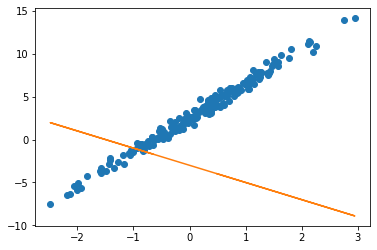

In [128]:
plt.plot(x,y,'o')
plt.plot(x,yhat.reshape(-1),'-')

- 현재 상황
- 최적의 적합선을 찾아보자!

`-` slope 설정 & 업데이트

In [129]:
slope= (2*X.T @ yhat - 2*X.T @ y)/ N
beta_hat2 = beta_hat - 0.1*slope
yhat2= X @ beta_hat2

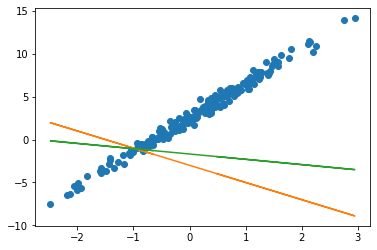

In [130]:
plt.plot(x,y,'o')
plt.plot(x,yhat.reshape(-1),'-')
plt.plot(x,yhat2.reshape(-1),'-')

- 한 번 업데이트 한 상황!
- 이를 반복해보자!

In [131]:
beta_hat=np.array([-3.0,-2.0]).reshape(2,1) # beta_hat 초기값
beta_hat

array([[-3.],
       [-2.]])

In [132]:
beta_hats = beta_hat.copy() # beta_hat 업데이트를 기록
for i in range(1,3): # 30번 반복해보자! 
    yhat = X @ beta_hat
    slope = (2*X.T @ yhat - 2*X.T @ y) / N # 기울기
    beta_hat = beta_hat - 0.1*slope # beta_hat 업데이트
    beta_hats = np.concatenate([beta_hats,beta_hat],axis=1) # 업데이트를 기록

In [133]:
beta_hats

array([[-3.        , -1.68472716, -0.68022307],
       [-2.        , -0.61702185,  0.44554171]])

- `np.concatenate([beta_hats,beta_hat],axis=1)`는 새로운 열에 업데이트된 값을 입력해준다!

In [134]:
beta_hats = beta_hat.copy() # beta_hat 업데이트를 기록
for i in range(1,30): # 30번 반복해보자! 
    yhat = X @ beta_hat
    slope = (2*X.T @ yhat - 2*X.T @ y) / N # 기울기
    beta_hat = beta_hat - 0.1*slope # beta_hat 업데이트
    beta_hats = np.concatenate([beta_hats,beta_hat],axis=1) # 업데이트를 기록

In [135]:
beta_hats

array([[-0.68022307,  0.08672067,  0.67210238,  1.11875026,  1.45941495,
         1.7191367 ,  1.91705714,  2.06780597,  2.18256204,  2.26986537,
         2.33623832,  2.38666093,  2.42493439,  2.45395915,  2.47594752,
         2.49258623,  2.50516069,  2.51465004,  2.52179967,  2.52717669,
         2.53121228,  2.53423404,  2.53649063,  2.53817069,  2.53941709,
         2.54033799,  2.54101514,  2.54151022,  2.54186973,  2.54212864],
       [ 0.44554171,  1.26213417,  1.88986849,  2.37256745,  2.74386105,
         3.02956128,  3.24948292,  3.41883973,  3.54931514,  3.64988338,
         3.72743931,  3.78728156,  3.8334832 ,  3.86917613,  3.89676933,
         3.91811638,  3.93464404,  3.94745097,  3.95738356,  3.96509417,
         3.97108583,  3.97574668,  3.97937637,  3.98220635,  3.98441557,
         3.98614243,  3.98749409,  3.98855359,  3.98938529,  3.9900392 ]])

- 베타값을 잘 추정했음!

`-` 추정치를 구분해서 저장해보자

In [136]:
beta_hats[0]

array([-0.68022307,  0.08672067,  0.67210238,  1.11875026,  1.45941495,
        1.7191367 ,  1.91705714,  2.06780597,  2.18256204,  2.26986537,
        2.33623832,  2.38666093,  2.42493439,  2.45395915,  2.47594752,
        2.49258623,  2.50516069,  2.51465004,  2.52179967,  2.52717669,
        2.53121228,  2.53423404,  2.53649063,  2.53817069,  2.53941709,
        2.54033799,  2.54101514,  2.54151022,  2.54186973,  2.54212864])

In [137]:
# beta_hats[0].tolist()

In [138]:
b0hats=beta_hats[0].tolist()
b1hats=beta_hats[1].tolist()

`-` fig 설정

In [139]:
fig = plt.figure(); fig.set_figheight(5); fig.set_figwidth(12)

<Figure size 864x360 with 0 Axes>

In [140]:
np.linalg.inv(X.T@X) @ X.T @ y

array([[2.54261954],
       [3.99254326]])

- 최적의 β값

`-` 목표:
- 왼쪽 그림: 초기의 β값에서의 적합선 -> 최적의 β값에서의 적합선으로 가는 과정
- 오른쪽 그림: (loss 함수에서) 초기의 β값 -> 최적의 β값으로 찾아가는 과정

In [141]:
ax1= fig.add_subplot(1,2,1)
ax2= fig.add_subplot(1,2,2,projection='3d')

# ax1: 왼쪽그림 
ax1.plot(x,y,'o')
line, = ax1.plot(x,b0hats[0] + b1hats[0]*x) 

# ax2: 오른쪽그림 
β0,β1 = np.meshgrid(np.arange(-6,11,0.25),np.arange(-6,11,0.25),indexing='ij')
β0=β0.reshape(-1)
β1=β1.reshape(-1)
loss_fn = lambda b0,b1: np.sum((y-b0-b1*x)**2)
loss = list(map(loss_fn, β0,β1))
ax2.scatter(β0,β1,loss,alpha=0.02) 
ax2.scatter(2.5451404,3.94818596,loss_fn(2.5451404,3.94818596),s=200,marker='*') 

def animate(i):
    line.set_ydata(b0hats[i] + b1hats[i]*x) 
    ax2.scatter(b0hats[i],b1hats[i],loss_fn(b0hats[i],b1hats[i]),color="grey") 

ani = animation.FuncAnimation(fig,animate,frames=30) 
ani

`-` $α$를 어떻게 잡는지가 중요! 
- $α = 0.1$은 적당한 것으로 보임!
- $α = 0.3$은 다소 빠른감이 있음
- $α = 0.5$는 너무 빠름
- $α = 0.9$는 수렴하기는 하지만 위험해보임
- $α = 1.0$은 수렴하지 않음..!
- $α = 1.2$는 터짐..! 
: 너무 큰 $α$를 잡으면 수렴되지 않을 수 있다! 천천히 가더라도 적당한 $α$를 잡아서 학습하자! 

---
##### 문법정리

``` python
1. np.meshgrid(): 
(이 예제에서)
(0,4)
(0,5)
(0,6)
(1,4)
(1,5)
(1,6)
(2,4)
(2,5)
(2,6)
```

In [147]:
np.meshgrid(np.array([0,1,2]),np.array([4,5,6]))

[array([[0, 1, 2],
        [0, 1, 2],
        [0, 1, 2]]),
 array([[4, 4, 4],
        [5, 5, 5],
        [6, 6, 6]])]

In [148]:
np.meshgrid(np.array([0,1,2]),np.array([4,5,6]),indexing='ij')

[array([[0, 0, 0],
        [1, 1, 1],
        [2, 2, 2]]),
 array([[4, 5, 6],
        [4, 5, 6],
        [4, 5, 6]])]

In [149]:
β0, β1 = np.meshgrid(np.array([0,1,2]),np.array([4,5,6]),indexing='ij')

In [150]:
β0

array([[0, 0, 0],
       [1, 1, 1],
       [2, 2, 2]])

In [151]:
β0, β1

(array([[0, 0, 0],
        [1, 1, 1],
        [2, 2, 2]]),
 array([[4, 5, 6],
        [4, 5, 6],
        [4, 5, 6]]))

In [152]:
β0.reshape(-1), β1.reshape(-1)

(array([0, 0, 0, 1, 1, 1, 2, 2, 2]), array([4, 5, 6, 4, 5, 6, 4, 5, 6]))

In [153]:
β0 = β0.reshape(-1)
β1 = β1.reshape(-1)

In [154]:
β0, β1

(array([0, 0, 0, 1, 1, 1, 2, 2, 2]), array([4, 5, 6, 4, 5, 6, 4, 5, 6]))

``` python
2. map(lambda :)
lambda 함수에 입력값을 넣어 계산
```

In [155]:
lambda x,y : x+y # 입력 : 출력

<function __main__.<lambda>(x, y)>

In [156]:
map(lambda x,y: x+y, β0,β1)

- 이를 실행한 순간 계산이 된 것!
- 계산결과는..?

In [157]:
list(map(lambda x,y: x+y, β0,β1))

[4, 5, 6, 5, 6, 7, 6, 7, 8]

- 리스트화 시켜주면 결과가 나옴

`-` β0, β1에 대한 loss를 계산

In [158]:
list(map(lambda b0,b1: np.sum(y-b0-b1*x)**2, β0,β1))

[10333399168.5941,
 8978154095.43275,
 7718134723.006397,
 3801132899.035396,
 2997904349.4963017,
 2289901500.692204,
 468866629.47669226,
 217654603.55985174,
 61668278.37801162]

`-` β0, β1 값을 변경해서 계산

In [159]:
β0, β1 = np.meshgrid(np.arange(-6,11,0.25),np.arange(-6,11,0.25),indexing='ij')
β0 = β0.reshape(-1)
β1 = β1.reshape(-1)

In [160]:
β0, β1 

(array([-6.  , -6.  , -6.  , ..., 10.75, 10.75, 10.75]),
 array([-6.  , -5.75, -5.5 , ..., 10.25, 10.5 , 10.75]))

In [161]:
# list(map(lambda b0,b1: np.sum((y-b0-b1*x)**2), β0,β1)) -> 이는 loss임!

---

#### 예제2

$y_i \approx \beta_0 +\beta_1 e^{-x_i}$ 

`-` 데이터

In [162]:
np.random.seed(50000) 
N= 100 
x= np.linspace(-1,1,N)
epsilon = np.random.randn(N)*0.5 
y= 2.5+4*np.exp(-x)+epsilon

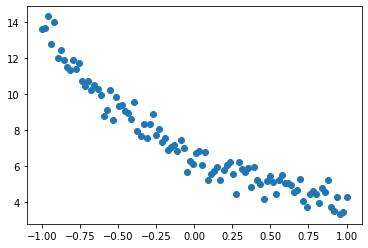

In [163]:
plt.plot(x,y,'o')

`-` 데이터 정리

In [164]:
X= np.stack([np.ones(N),np.exp(-x)],axis=1)
y= y.reshape(N,1)

In [165]:
beta_hat = np.array([-3,-2]).reshape(2,1)
beta_hats = beta_hat.copy() # shallow copy, deep copy 
for i in range(1,30): 
    yhat = X@beta_hat 
    slope = (2*X.T@X@beta_hat - 2*X.T@y) /N 
    beta_hat = beta_hat - 0.05*slope # 학습율을 0.05로 설정 
    beta_hats = np.concatenate([beta_hats,beta_hat],axis=1) # column에 업데이트 기록 

In [166]:
beta_hats # 업데이트된 β추정치

array([[-3.        , -1.73502832, -0.80429684, -0.11871764,  0.38703886,
         0.76088009,  1.03793772,  1.24397484,  1.39788447,  1.5135218 ,
         1.60104769,  1.66791393,  1.71958573,  1.76007149,  1.79231134,
         1.81846199,  1.84010569,  1.8584034 ,  1.87420715,  1.88814241,
         1.90066848,  1.91212283,  1.92275358,  1.93274328,  1.94222643,
         1.95130225,  1.9600441 ,  1.96850638,  1.97672954,  1.9847438 ],
       [-2.        , -0.23785241,  1.05213499,  1.99592103,  2.68587152,
         3.18971828,  3.55712888,  3.8245243 ,  4.01861169,  4.15897501,
         4.25997474,  4.33214099,  4.38319501,  4.4187983 ,  4.44310199,
         4.4591496 ,  4.46917247,  4.47480637,  4.47725033,  4.47738314,
         4.47584875,  4.47311891,  4.46953912,  4.46536229,  4.46077343,
         4.45590779,  4.45086414,  4.44571448,  4.4405112 ,  4.43529232]])

In [167]:
b0hats=beta_hats[0].tolist()
b1hats=beta_hats[1].tolist()

In [168]:
np.linalg.inv(X.T@X)@X.T@y

array([[2.44692071],
       [4.10965865]])

- 최적의 추정치

`-` fig 설정

In [169]:
fig = plt.figure(); fig.set_figheight(5); fig.set_figwidth(12)

<Figure size 864x360 with 0 Axes>

`-` 애니메이션

In [170]:
ax1= fig.add_subplot(1,2,1)
ax2= fig.add_subplot(1,2,2,projection='3d')

# ax1: 왼쪽그림 
ax1.plot(x,y,'o')
line, = ax1.plot(x,b0hats[0] + b1hats[0]*np.exp(-x)) # 예제 1 코드에서 x대신 np.exp(-x)

# ax2: 오른쪽그림 
β0,β1 = np.meshgrid(np.arange(-6,11,0.25),np.arange(-6,11,0.25),indexing='ij')
β0=β0.reshape(-1)
β1=β1.reshape(-1)
loss_fn = lambda b0,b1: np.sum((y-b0-b1*np.exp(-x))**2) # 예제 1 코드에서 x대신 np.exp(-x)
loss = list(map(loss_fn, β0,β1))
ax2.scatter(β0,β1,loss,alpha=0.02) 
ax2.scatter(2.46307644,3.99681332,loss_fn(2.46307644,3.99681332),s=200,marker='*') 

def animate(i):
    line.set_ydata(b0hats[i] + b1hats[i]*np.exp(-x)) # b0hats[i] + b1hats[i]*np.exp(-x) -> yhat # 예제 1 코드에서 x대신 np.exp(-x)
    ax2.scatter(b0hats[i],b1hats[i],loss_fn(b0hats[i],b1hats[i]),color="grey") 

ani = animation.FuncAnimation(fig,animate,frames=30) 
ani

#### 예제3

$y_i \approx \beta_0 +\beta_1 e^{-x_i} + \beta_2 \cos(5x_i)$ 

`-` 데이터

In [171]:
np.random.seed(50000) 
N= 100 
x= np.linspace(-1,1,N)
epsilon = np.random.randn(N)*0.5 
y= 2.5+4*np.exp(-x) + 5*np.cos(5*x) + epsilon

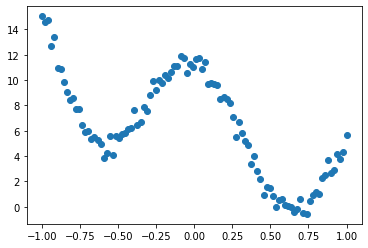

In [172]:
plt.plot(x,y,'o')

`-` 데이터 정리

In [173]:
X=np.stack([np.ones(N),np.exp(-x),np.cos(5*x)],axis=1) 
y=y.reshape(N,1)

In [174]:
beta_hat = np.array([-3,-2,-1]).reshape(3,1) 
beta_hats = beta_hat.copy()
for i in range(1,30):
    yhat = X@beta_hat 
    slope = (2*X.T@X@beta_hat -2*X.T@y) /N 
    beta_hat = beta_hat - 0.1 * slope 
    beta_hats= np.concatenate([beta_hats,beta_hat],axis=1) # 업데이트 기록

In [175]:
beta_hats

array([[-3.        , -0.69429935,  0.39518121,  0.92619793,  1.19969943,
         1.35346173,  1.45063354,  1.52022672,  1.57563243,  1.62308901,
         1.66555491,  1.7044804 ,  1.74061845,  1.77439615,  1.80608509,
         1.83587982,  1.86393424,  1.89037863,  1.91532789,  1.93888566,
         1.96114652,  1.98219738,  2.00211834,  2.02098336,  2.03886084,
         2.05581406,  2.07190161,  2.0871778 ,  2.10169294,  2.11549372],
       [-2.        ,  1.20703823,  2.69616455,  3.39736489,  3.73611249,
         3.90716167,  3.99974804,  4.05484069,  4.0913234 ,  4.11796784,
         4.13890973,  4.15615392,  4.1707209 ,  4.18317186,  4.19384964,
         4.20298956,  4.21077081,  4.21734051,  4.2228253 ,  4.22733713,
         4.23097634,  4.23383353,  4.23599079,  4.2375226 ,  4.23849656,
         4.23897405,  4.2390108 ,  4.23865734,  4.23795949,  4.23695878],
       [-1.        , -0.97088711, -0.6887562 , -0.31363003,  0.08323465,
         0.47100949,  0.83720468,  1.17758046,  1

- β0, β1, β2까지 있으니 3개의 값이 나왔음

In [176]:
b0hats = beta_hats[0].tolist()
b1hats = beta_hats[1].tolist()
b2hats = beta_hats[2].tolist()

In [177]:
(b0hats,b1hats,b2hats) = beta_hats

In [178]:
b0hats,b1hats,b2hats = beta_hats # 튜플 언패킹

In [179]:
np.linalg.inv(X.T@X) @ X.T @ y

array([[2.44123036],
       [4.10153568],
       [4.91830278]])

- 최적의 β추정치

`-` fig 설정

In [180]:
fig = plt.figure(); fig.set_figheight(5); fig.set_figwidth(12)

<Figure size 864x360 with 0 Axes>

`-` 애니메이션

In [181]:
ax1= fig.add_subplot(1,2,1)
ax2= fig.add_subplot(1,2,2,projection='3d')

# ax1: 왼쪽그림 
ax1.plot(x,y,'o')
line, = ax1.plot(x,b0hats[0] + b1hats[0]*np.exp(-x) + b2hats[0]*np.cos(5*x))

# ax2: 오른쪽그림 
# β0,β1 = np.meshgrid(np.arange(-6,11,0.25),np.arange(-6,11,0.25),indexing='ij')
# β0=β0.reshape(-1)
# β1=β1.reshape(-1)
# loss_fn = lambda b0,b1: np.sum((y-b0-b1*np.exp(-x))**2)
# loss = list(map(loss_fn, β0,β1))
# ax2.scatter(β0,β1,loss,alpha=0.02) 
# ax2.scatter(2.46307644,3.99681332,loss_fn(2.46307644,3.99681332),s=200,marker='*') 

def animate(i):
    line.set_ydata(b0hats[i] + b1hats[i]*np.exp(-x) + b2hats[i]*np.cos(5*x))
    # ax2.scatter(b0hats[i],b1hats[i],loss_fn(b0hats[i],b1hats[i]),color="grey") 

ani = animation.FuncAnimation(fig,animate,frames=30) 
ani

#### 예제3: 케라스를 이용한 풀이

$y_i \approx \beta_0 +\beta_1 e^{-x_i} + \beta_2 \cos(5x_i)$ 

`-` 데이터

In [182]:
np.random.seed(50000) 
N= 100 
x= np.linspace(-1,1,N)
epsilon = np.random.randn(N)*0.5 
y= 2.5+4*np.exp(-x) + 5*np.cos(5*x) + epsilon

`-` 데이터정리

In [183]:
X=np.stack([np.ones(N),np.exp(-x),np.cos(5*x)],axis=1) 
y=y.reshape(N,1)

In [184]:
# 1: 네트워크 생성
net = tf.keras.Sequential()

# 2: add layer 
net.add(tf.keras.layers.Dense(1,use_bias=False))

# 3: compile
net.compile(tf.optimizers.SGD(0.1), loss='mse')

# 4: fit 
net.fit(X,y,epochs=30, batch_size=N) 

Epoch 1/30
1/1 [==============================] - 0s 350ms/step - loss: 42.0394
Epoch 2/30
1/1 [==============================] - 0s 7ms/step - loss: 18.8108
Epoch 3/30
1/1 [==============================] - 0s 9ms/step - loss: 12.3693
Epoch 4/30
1/1 [==============================] - 0s 7ms/step - loss: 9.6941
Epoch 5/30
1/1 [==============================] - 0s 6ms/step - loss: 8.0211
Epoch 6/30
1/1 [==============================] - 0s 6ms/step - loss: 6.7375
Epoch 7/30
1/1 [==============================] - 0s 19ms/step - loss: 5.6863
Epoch 8/30
1/1 [==============================] - 0s 10ms/step - loss: 4.8101
Epoch 9/30
1/1 [==============================] - 0s 6ms/step - loss: 4.0765
Epoch 10/30
1/1 [==============================] - 0s 7ms/step - loss: 3.4616
Epoch 11/30
1/1 [==============================] - 0s 6ms/step - loss: 2.9461
Epoch 12/30
1/1 [==============================] - 0s 7ms/step - loss: 2.5137
Epoch 13/30
1/1 [==============================] - 0s 13ms/step - 

- loss가 잘 줄어들고 있는지 확인!
- loss값의 변화가 커졌다 작아졌다를 반복하거나 급격하게 줄어들지는 않는지 확인해볼 필요가 있음(epoc이 지금처럼 작을 때만 가능)

In [185]:
net.weights

[<tf.Variable 'dense_14/kernel:0' shape=(3, 1) dtype=float32, numpy=
 array([[2.237946 ],
        [4.1701503],
        [4.4928823]], dtype=float32)>]

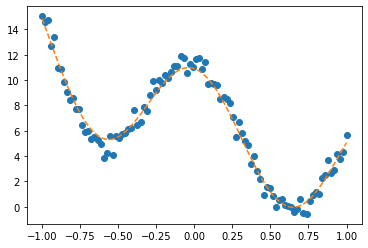

In [186]:
plt.plot(x,y,'o') 
plt.plot(x,(X@net.weights).reshape(-1),'--')

- 적합한 회귀선이 추정되었음!

#### 추가학습
예제2: 케라스를 이용하여 아래를 만족하는 적절한 $\beta_0$와 $\beta_1$을 구하라. 적합결과를 시각화하라.

$y_i \approx \beta_0 +\beta_1 e^{-x_i}$ 

In [271]:
np.random.seed(43052) 
N= 100 
x= np.linspace(-1,1,N)
epsilon = np.random.randn(N)*0.5 
y= 2.5+4*np.exp(-x) +epsilon

In [272]:
X=np.stack([np.ones(N),np.exp(-x)],axis=1) 
y=y.reshape(N,1)

In [273]:
# 1: 네트워크 생성
net = tf.keras.Sequential()

# 2: add layer 
net.add(tf.keras.layers.Dense(1,use_bias=False))

# 3: compile
net.compile(tf.optimizers.SGD(0.05), loss='mse')

# 4: fit 
net.fit(X,y,epochs=30, verbose=0, batch_size=N) 

In [274]:
net.weights

[<tf.Variable 'dense_32/kernel:0' shape=(2, 1) dtype=float32, numpy=
 array([[2.5152497],
        [3.9593651]], dtype=float32)>]

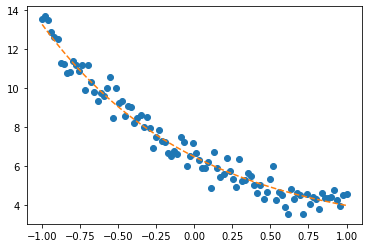

In [275]:
plt.plot(x,y,'o') 
plt.plot(x,(X@net.weights).reshape(-1),'--')

- β0= 2.515 β1= 3.959이고 적합된 회귀직선은 $y_i = 2.515 +3.959 e^{-x_i}$이다.